# Installing Needed Libraries


In [ ]:
# install needed libraries

!pip install nltk
!pip install spacy

!pip install numpy
!pip install pandas

!pip install matplotlib

!pip install wordcloud





In [ ]:
!pip install tensorflow

# Imports

In [ ]:


import nltk
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
from nltk.stem import PorterStemmer
from nltk.probability import FreqDist
from nltk.tokenize import sent_tokenize, word_tokenize
from wordcloud import WordCloud
import matplotlib.pyplot as plt
import re
import string
import pandas as pd
import numpy as np
import spacy
import tensorflow as tf
from tensorflow.keras.preprocessing import sequence
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Embedding, SimpleRNN




[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


Importing the dataset

In [ ]:


file_path = "/content/Game_of_Thrones_Script.csv"


# Read the CSV file into a Pandas DataFrame
dataframe = pd.read_csv(file_path)

# Display the first few rows of the DataFrame to verify it was read correctly
dataframe.head()


,Release Date,Season,Episode,Episode Title,Name,Sentence
0,2011-04-17,Season 1,Episode 1,Winter is Coming,waymar royce,What do you expect? They're savages. One lot s...
1,2011-04-17,Season 1,Episode 1,Winter is Coming,will,I've never seen wildlings do a thing like this...
2,2011-04-17,Season 1,Episode 1,Winter is Coming,waymar royce,How close did you get?
3,2011-04-17,Season 1,Episode 1,Winter is Coming,will,Close as any man would.
4,2011-04-17,Season 1,Episode 1,Winter is Coming,gared,We should head back to the wall.


# Get most frequent Sentences

In [ ]:
# get most frequent sentences and their counts

def get_most_frequent_sentences(dataframe, n):
    # Get the most frequent sentences
    most_frequent_sentences = dataframe['Sentence'].value_counts().head(n)
    return most_frequent_sentences.index.tolist(), most_frequent_sentences.values.tolist()




# display the top 100 most frequent sentences and their frequencies

most_frequent_sentences, most_frequent_sentence_counts = get_most_frequent_sentences(dataframe, 100)
print("Top 100 Most Frequent Sentences:")
for i in range(len(most_frequent_sentences)):
    print(f"{most_frequent_sentences[i]}: {most_frequent_sentence_counts[i]}")


Top 100 Most Frequent Sentences:
No.: 103
Your Grace.: 56
Why?: 52
What?: 44
Yes.: 40
Thank you.: 26
Who are you?: 24
What are you doing?: 24
And?: 23
What is it?: 20
Aye.: 20
Good.: 20
No!: 19
What do you want?: 16
Hodor.: 16
Who?: 14
My lord.: 13
Of course.: 13
I don't know.: 13
Oh.: 12
Why not?: 12
I do.: 12
I know.: 11
Where?: 11
What are you doing here?: 10
Come on.: 10
How?: 10
Come on!: 9
Yes, Your Grace.: 9
Valar morghulis.: 9
Please.: 9
Go on.: 9
Hmm.: 9
Yes, my lord.: 9
I can't.: 9
I did.: 9
Where are you going?: 9
Come in.: 8
Come.: 8
EPISODE: 8
Mmm.: 8
Never.: 8
Now!: 8
How many?: 8
Not yet.: 7
Ser Jaime.: 7
Don't.: 7
Hello.: 7
How do you know?: 7
What's your name?: 7
No, my lord.: 6
Nothing.: 6
I'm sorry.: 6
CREDITS: 6
Mm-hmm.: 6
My lady.: 6
Jon Snow.: 6
Open the gate!: 6
Long may he reign.: 6
Lord Baelish.: 6
For the night is dark and full of terrors.: 6
Go!: 6
What's this?: 6
I will.: 6
It is.: 6
Khaleesi.: 6
I am.: 5
Yeah.: 5
It doesn't matter.: 5
How do you know that?:

# Data Cleaning

In [ ]:
# check for missing and null values
dataframe.isnull().sum()


Release Date     0
Season           0
Episode          0
Episode Title    0
Name             3
Sentence         1
dtype: int64

Dropping null values and unnecessary columns

In [ ]:
# Drop the release date column
dataframe = dataframe.drop(columns=['Release Date'])


# Drop the rows with null values in the dataframe
dataframe = dataframe.dropna()

# check one more time for the missing values

dataframe.isnull().sum()


Season           0
Episode          0
Episode Title    0
Name             0
Sentence         0
dtype: int64

To Lowercase

In [ ]:

dataframe['Sentence'] = dataframe['Sentence'].str.lower()
dataframe


<ipython-input-73-0848e66a85a3>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataframe['Sentence'] = dataframe['Sentence'].str.lower()


,Season,Episode,Episode Title,Name,Sentence
0,Season 1,Episode 1,Winter is Coming,waymar royce,what do you expect? they're savages. one lot s...
1,Season 1,Episode 1,Winter is Coming,will,i've never seen wildlings do a thing like this...
2,Season 1,Episode 1,Winter is Coming,waymar royce,how close did you get?
3,Season 1,Episode 1,Winter is Coming,will,close as any man would.
4,Season 1,Episode 1,Winter is Coming,gared,we should head back to the wall.
...,...,...,...,...,...
23906,Season 8,Episode 6,The Iron Throne,brienne,i think we can all agree that ships take prece...
23907,Season 8,Episode 6,The Iron Throne,bronn,i think that's a very presumptuous statement.
23908,Season 8,Episode 6,The Iron Throne,tyrion lannister,i once brought a jackass and a honeycomb into ...
23909,Season 8,Episode 6,The Iron Throne,man,the queen in the north!


Expand Contractions

In [ ]:
contractions = {
    "ain't": "is not",
    "aren't": "are not",
    "can't": "cannot",
    "'d": " would",
    "'ll": " will",
    "'m": " am",
    "'re": " are",
    "'ve": " have",
    "n't": " not",
    "don't": "do not",
    "won't": "will not",
    "what's": "what is",
    "let's": "let us",
    "who's": "who is",
    "where's": "where is",
    "when's": "when is",
    "how's": "how is",
    "it's": "it is",
    "that's": "that is",
    "there's": "there is",
    "here's": "here is",
    "who'd": "who would",
    "he's": "he is",
    "he'd": "he would",
    "she's": "she is",
    "she'd": "she would",
    "it'd": "it would",
    "they're": "they are",
    "they'd": "they would",
    "we're": "we are",
    "we'd": "we would",
    "you're": "you are",
    "you'd": "you would",
    "i'm": "i am",
    "i'd": "i would",
    "i've": "i have",
    "i'll": "i will"
}

def expand_contraction(word):
    if word in contractions:
        return contractions[word]
    return word

def expand_contractions(word):
    for contraction in contractions:
         if contraction in word:
            #return contractions[contraction] # return the word without the contraction and return the contraction substitution
            return word.replace(contraction, contractions[contraction]) # if the word is not a contraction
        # just return it back since it is not a contraction

    return word

# apply the first function to the dataframe
dataframe['Sentence'] = dataframe['Sentence'].apply(lambda x: ' '.join(expand_contraction(word) for word in x.split()))

# apply the second function to the dataframe
dataframe['Sentence'] = dataframe['Sentence'].apply(lambda x: ' '.join(expand_contractions(word) for word in x.split()))





Remove Stop Words

In [ ]:
# remove stopwords

stop_words = set(stopwords.words('english'))

def remove_stopwords(sentence):
    if isinstance(sentence, str):
        return ' '.join([word for word in sentence.split() if word not in stop_words])
    else:
        return sentence

#dataframe['Sentence'] = dataframe['Sentence'].apply(remove_stopwords)


Remove Punctuation

In [ ]:
# remove punctuation

def remove_punctuation(sentence):
    if isinstance(sentence, str):
        return sentence.translate(str.maketrans('', '', string.punctuation))
    else:
        return sentence


dataframe['Sentence'] = dataframe['Sentence'].apply(remove_punctuation)


# Check for additional words that would not add meaning to the dataset

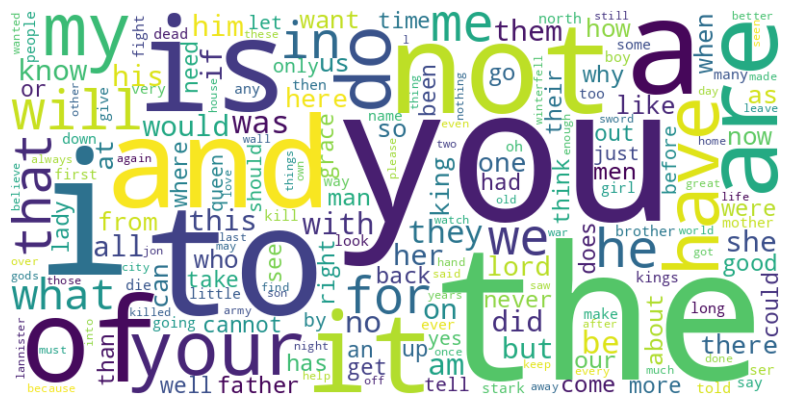

[('you', 12469), ('the', 12265), ('i', 10103), ('to', 7996), ('a', 6115), ('is', 5666), ('not', 5339), ('and', 5300), ('of', 4568), ('it', 4011), ('are', 3465), ('your', 3329), ('have', 3304), ('my', 3229), ('do', 3211), ('will', 3135), ('he', 2952), ('me', 2919), ('that', 2797), ('we', 2717), ('in', 2667), ('for', 2570), ('what', 2136), ('they', 1892), ('be', 1847), ('was', 1831), ('am', 1713), ('no', 1673), ('with', 1614), ('him', 1463)]


In [ ]:
# check for top 30 most used words and display them in a word cloud
all_words = ' '.join(dataframe['Sentence'])

from collections import Counter
from wordcloud import WordCloud
counter = Counter(all_words.split())

# Generate word cloud
wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(counter)

# Display the word cloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

print(counter.most_common(30))


In [ ]:
# create a list with the words that i found in the code block above
words_to_remove = ['would', 'you','know','like', 'me','want', 'it', 'us', 'get','think','could','take','need','see','him','go','make','them','here','look','yes','no','going','thank']

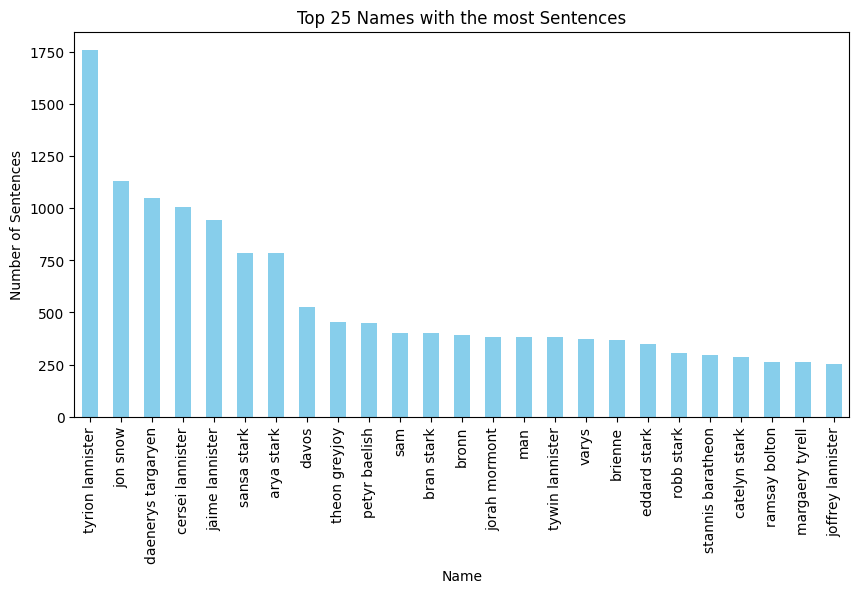

In [ ]:
# get top 25 Names with the most Sentences

top_25_names = dataframe['Name'].value_counts().head(25)
top_25_names

# visulaize them in a plot

top_25_names.plot(kind='bar', figsize=(10, 5), color='skyblue')
plt.title('Top 25 Names with the most Sentences')
plt.xlabel('Name')
plt.ylabel('Number of Sentences')
plt.show()



# Make the rest of the characters as one man

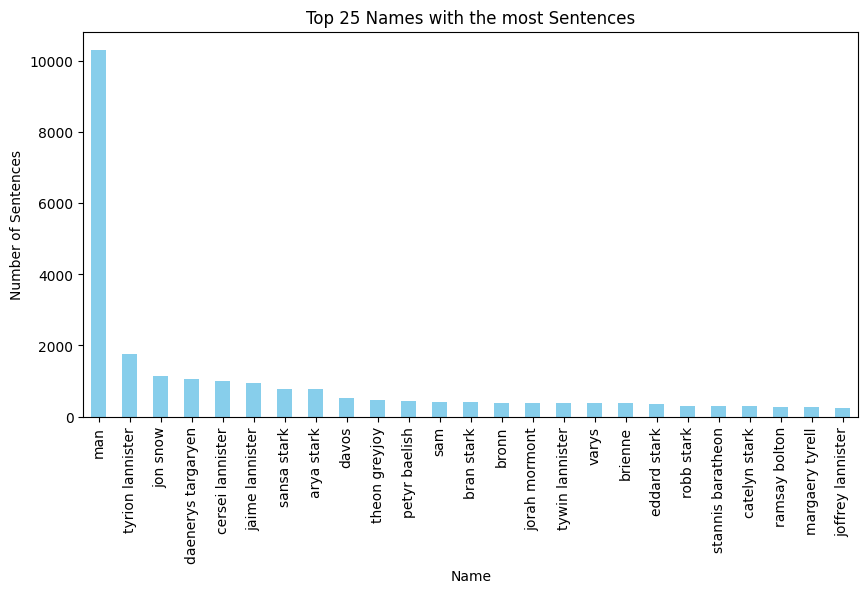

In [ ]:
# Get the names after the top 25
names_to_change = dataframe['Name'].value_counts().index[25:]
names_to_change
# Change the names to "man"
dataframe.loc[dataframe['Name'].isin(names_to_change), 'Name'] = 'man'


# Get the top 25 names after the change

top_25_names = dataframe['Name'].value_counts().head(25)
top_25_names.plot(kind='bar', figsize=(10, 5), color='skyblue')
plt.title('Top 25 Names with the most Sentences')
plt.xlabel('Name')
plt.ylabel('Number of Sentences')
plt.show()

# N-Grams

Bigrams

In [ ]:
# get bigrams

from nltk import bigrams
from nltk import FreqDist

def get_bigrams(sentence):
    if isinstance(sentence, str):
        return list(bigrams(sentence.split()))
    else:
        return sentence

dataframe['Bigrams'] = dataframe['Sentence'].apply(get_bigrams)
# Transform lists of tuples into strings
dataframe['Bigrams'] = dataframe['Bigrams'].apply(lambda x: ' '.join(['_'.join(tup) for tup in x]))


In [ ]:
# get top 50 bigrams and show all of them




bigrams = dataframe['Bigrams'].str.split(expand=True).stack().value_counts().head(50)
bigrams



i_am          1606
do_not        1514
you_are       1424
it_is         1145
of_the        1020
in_the         885
i_have         852
i_will         783
i_do           702
do_you         675
he_is          627
you_have       625
to_the         569
that_is        567
you_will       546
is_not         516
is_a           507
your_grace     492
did_not        482
we_are         457
will_be        446
i_was          443
are_you        432
to_be          430
you_do         402
if_you         398
and_i          391
will_not       387
i_would        381
want_to        375
there_is       368
are_not        364
is_the         356
you_know       354
on_the         350
my_lord        331
she_is         327
for_the        323
and_you        313
and_the        310
we_have        310
they_are       306
you_want       303
going_to       299
i_know         299
the_king       294
what_is        293
i_did          291
am_not         290
for_you        289
Name: count, dtype: int64

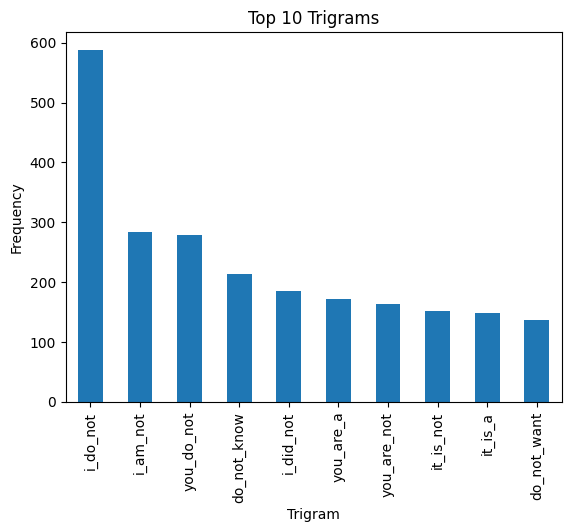

In [ ]:
# get n-grams with n=3, n=4, n=5

from nltk import ngrams

def get_ngrams(sentence, n):
    if isinstance(sentence, str):
        return list(ngrams(sentence.split(), n))
    else:
        return sentence


dataframe['Trigrams'] = dataframe['Sentence'].apply(lambda x: get_ngrams(x, 3))
dataframe['Trigrams'] = dataframe['Trigrams'].apply(lambda x: ' '.join(['_'.join(tup) for tup in x]))

dataframe['Fourgrams'] = dataframe['Sentence'].apply(lambda x: get_ngrams(x, 4))
dataframe['Fourgrams'] = dataframe['Fourgrams'].apply(lambda x: ' '.join(['_'.join(tup) for tup in x]))

dataframe['Fivegrams'] = dataframe['Sentence'].apply(lambda x: get_ngrams(x, 5))

dataframe['Fivegrams'] = dataframe['Fivegrams'].apply(lambda x: ' '.join(['_'.join(tup) for tup in x]))


# get top 10 trigrams

trigrams = dataframe['Trigrams'].str.split(expand=True).stack().value_counts().head(10)
trigrams.plot(kind='bar')
plt.title('Top 10 Trigrams')
plt.xlabel('Trigram')
plt.ylabel('Frequency')
plt.show()


Top Fourgrams

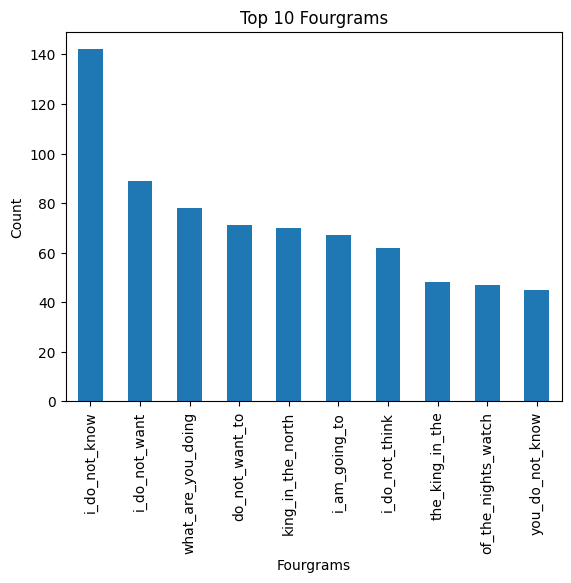

i_do_not_know          142
i_do_not_want           89
what_are_you_doing      78
do_not_want_to          71
king_in_the_north       70
i_am_going_to           67
i_do_not_think          62
the_king_in_the         48
of_the_nights_watch     47
you_do_not_know         45
Name: count, dtype: int64

In [ ]:
# get top 10 fourgrams

fourgrams = dataframe['Fourgrams'].str.split(expand=True).stack().value_counts().head(10)
fourgrams.plot(kind='bar')
plt.xlabel('Fourgrams')
plt.ylabel('Count')
plt.title('Top 10 Fourgrams')
plt.show()
fourgrams

Top Fivegrams

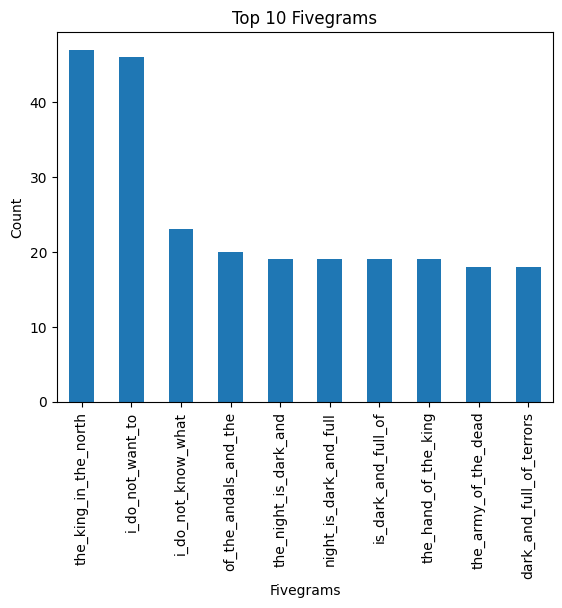

In [ ]:
# get top 10 fivegrams

fivegrams = dataframe['Fivegrams'].str.split(expand=True).stack().value_counts().head(10)
fivegrams.plot(kind='bar')
plt.xlabel('Fivegrams')
plt.ylabel('Count')
plt.title('Top 10 Fivegrams')
plt.show()


# Create wordcloud for the top 25 characters

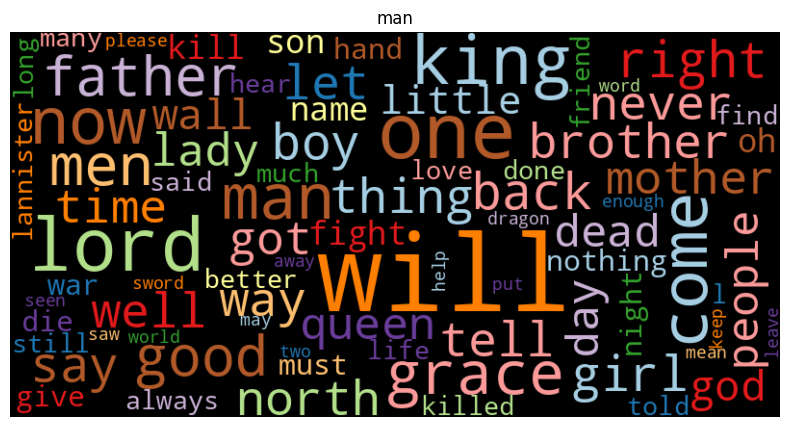

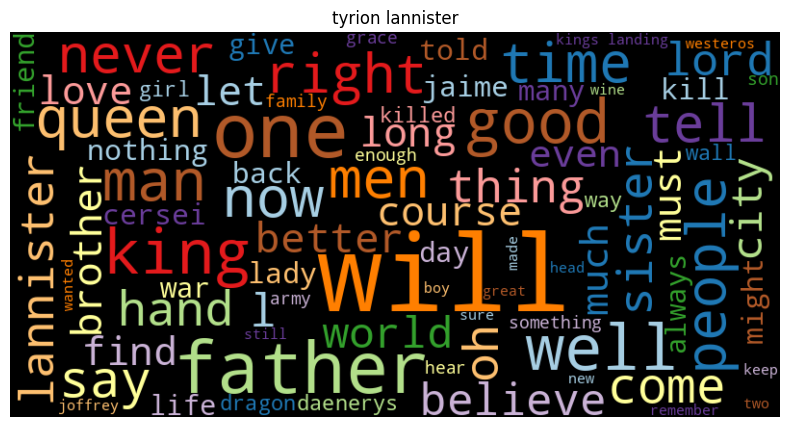

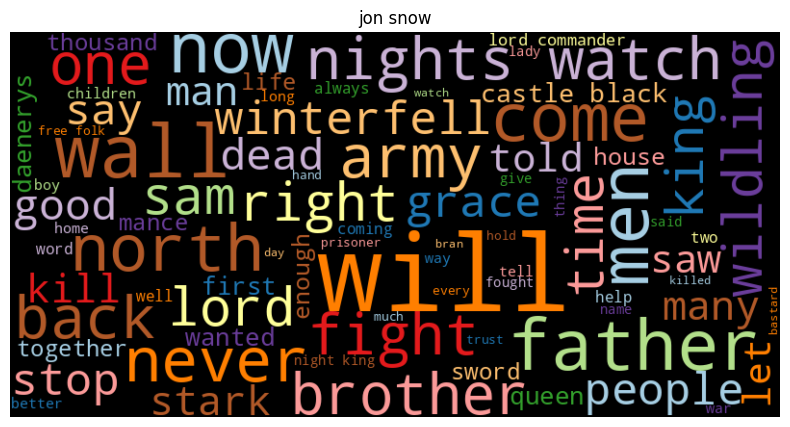

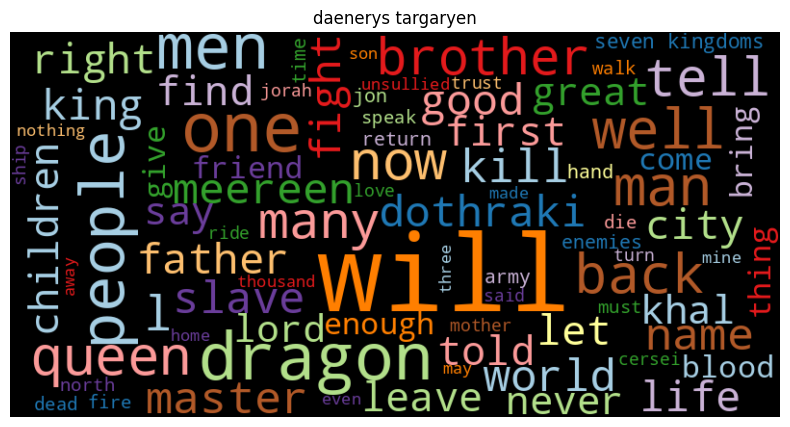

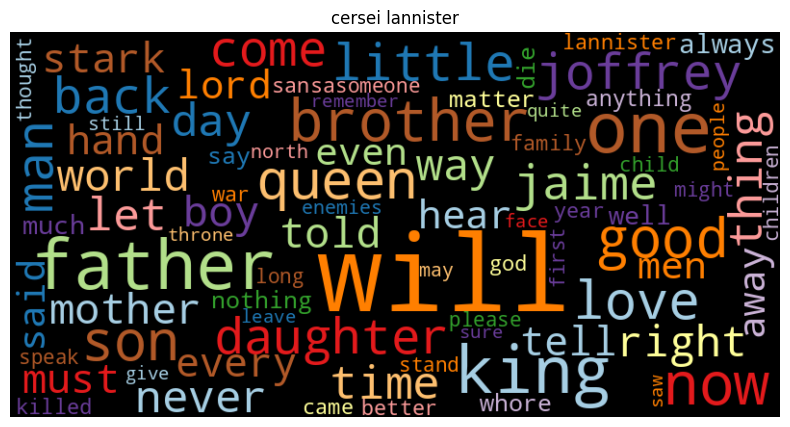

...

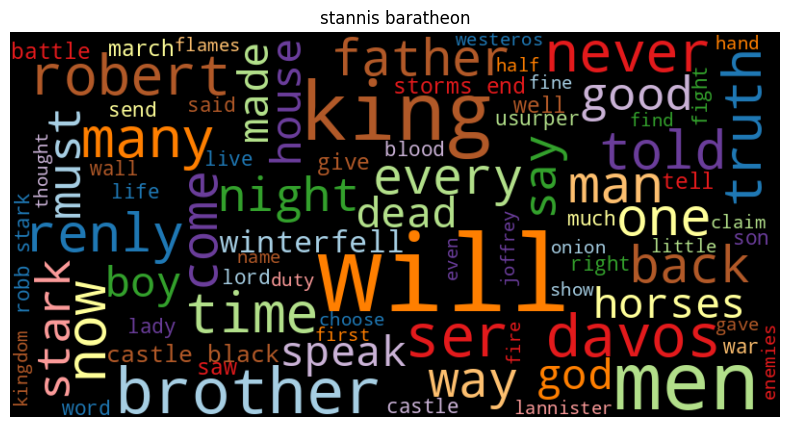

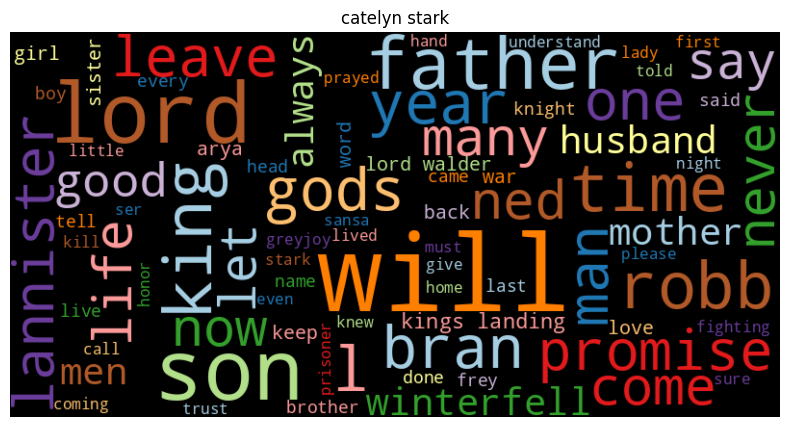

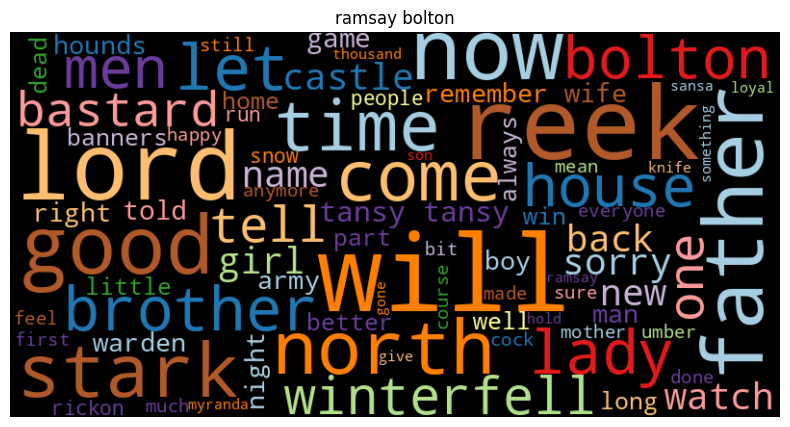

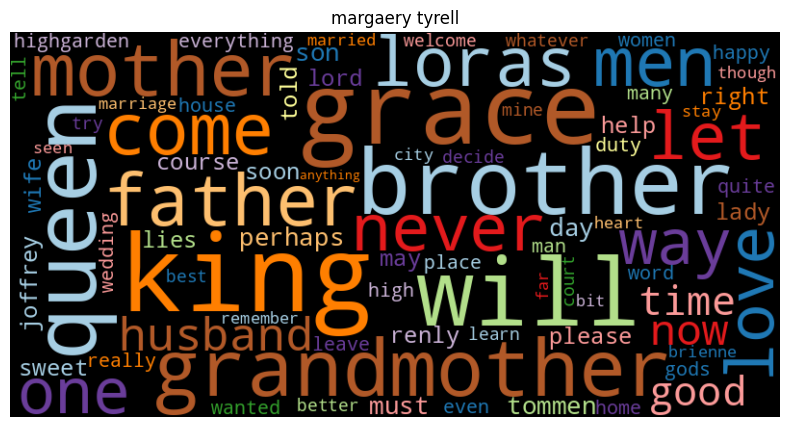

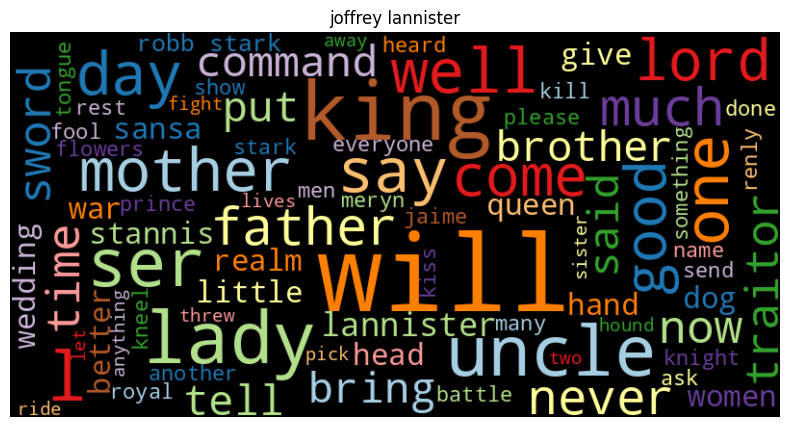

In [ ]:


# get top 25 characters
top_20_names = dataframe['Name'].value_counts().head(25)



def create_wordcloud(name):
    text = dataframe[dataframe['Name'] == name]['Sentence'].str.cat(sep=' ')
    # remove from the text words_to_remove
    text = ' '.join([word for word in text.split() if word not in words_to_remove])
    wordcloud = WordCloud(width=800, height=400, random_state=21, max_font_size=110, max_words= 80, colormap = 'Paired').generate(text)
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis('off')
    plt.title(name)
    plt.show()

for name in top_20_names.index:
    create_wordcloud(name)

In [ ]:
# prompt: create a vocabulary from the dataset

vocab = Counter()
for sentence in dataframe['Sentence']:
    for word in sentence.split():
        vocab[word] += 1

# Print the vocabulary

print(vocab)


Counter({'you': 12469, 'the': 12265, 'i': 10103, 'to': 7996, 'a': 6115, 'is': 5666, 'not': 5339, 'and': 5300, 'of': 4568, 'it': 4011, 'are': 3465, 'your': 3329, 'have': 3304, 'my': 3229, 'do': 3211, 'will': 3135, 'he': 2952, 'me': 2919, 'that': 2797, 'we': 2717, 'in': 2667, 'for': 2570, 'what': 2136, 'they': 1892, 'be': 1847, 'was': 1831, 'am': 1713, 'no': 1673, 'with': 1614, 'him': 1463, 'would': 1459, 'this': 1437, 'her': 1409, 'but': 1391, 'if': 1374, 'all': 1352, 'on': 1322, 'she': 1306, 'his': 1287, 'know': 1259, 'did': 1240, 'them': 1239, 'lord': 1108, 'one': 1092, 'as': 1041, 'there': 1027, 'here': 1016, 'at': 995, 'us': 959, 'who': 897, 'from': 896, 'how': 887, 'want': 886, 'so': 868, 'like': 864, 'can': 837, 'now': 824, 'when': 816, 'king': 805, 'our': 764, 'men': 753, 'about': 739, 'man': 734, 'come': 700, 'were': 674, 'father': 667, 'good': 661, 'never': 656, 'why': 637, 'go': 628, 'back': 625, 'has': 625, 'think': 589, 'their': 575, 'see': 571, 'get': 564, 'could': 560, 'ca

In [ ]:
# prompt: create a tokenizer from keras and print the length and the output

from tensorflow.keras.preprocessing.text import Tokenizer

# Create the tokenizer
tokenizer = Tokenizer(num_words=100)

# Fit the tokenizer on the sentences
tokenizer.fit_on_texts(dataframe['Sentence'])

# Print the length of the vocabulary
print(len(tokenizer.word_index))

# Print the output of the tokenizer
print(tokenizer.word_index)


10047
{'you': 1, 'the': 2, 'i': 3, 'to': 4, 'a': 5, 'is': 6, 'not': 7, 'and': 8, 'of': 9, 'it': 10, 'are': 11, 'your': 12, 'have': 13, 'my': 14, 'do': 15, 'will': 16, 'he': 17, 'me': 18, 'that': 19, 'we': 20, 'in': 21, 'for': 22, 'what': 23, 'they': 24, 'be': 25, 'was': 26, 'am': 27, 'no': 28, 'with': 29, 'him': 30, 'would': 31, 'this': 32, 'her': 33, 'but': 34, 'if': 35, 'all': 36, 'on': 37, 'she': 38, 'his': 39, 'know': 40, 'did': 41, 'them': 42, 'lord': 43, 'one': 44, 'as': 45, 'there': 46, 'here': 47, 'at': 48, 'us': 49, 'who': 50, 'from': 51, 'how': 52, 'want': 53, 'so': 54, 'like': 55, 'can': 56, 'now': 57, 'when': 58, 'king': 59, 'our': 60, 'men': 61, 'about': 62, 'man': 63, 'come': 64, 'were': 65, 'father': 66, 'good': 67, 'never': 68, 'why': 69, 'go': 70, 'back': 71, 'has': 72, 'think': 73, 'their': 74, 'see': 75, 'get': 76, 'could': 77, 'cannot': 78, 'or': 79, 'well': 80, 'more': 81, 'take': 82, 'right': 83, 'grace': 84, 'need': 85, 'time': 86, 'been': 87, 'an': 88, 'out': 89

In [ ]:
# prompt: download the nltk english corpus


import nltk
nltk.download('words')


[nltk_data] Downloading package words to /root/nltk_data...
[nltk_data]   Package words is already up-to-date!


True

In [ ]:
# prompt: extract non english words from the tokenizer
import nltk
english_words = set(nltk.corpus.words.words())
non_english_words = set(tokenizer.word_index.keys()) - english_words
print(non_english_words)


{'boxes', 'pounds', 'followed', 'dreaming', 'kidnapped', 'mhaegen', '“steffon', 'selwyn', 'halfhanded', 'docking', 'fantasies', 'winterhell', 'bullseye', 'fortresses', 'uhhuh', 'poured', '“well”', 'mord', 'nudo', 'dragons”', 'ulf', 'vines', 'mikkens', 'supervising', 'tysha', 'stormcrows', 'births', 'awed', 'truth…', 'cheeks', 'in…', 'glorified', 'weeks', 'archmaester', 'uttered', 'corpses', 'duncan', 'approaches', 'rams', 'iderenna', 'recovered', 'preparing', 'picturing', 'cunts', 'downit', 'arises', 'newest', 'dealings', '‘cause', 'nancies', 'ganes', 'cooked', 'paces', 'mainland', 'defied', 'wolves', 'annoyed', 'ius', 'wellsuited', 'vanquished', 'kingdoms…', 'lysene', 'hiya', 'yielded', 'shudders', 'islands', 'tokens', 'impunent', 'lyannas', 'realized', 'rast', 'risked', 'miracles', 'amputations', 'figureeight', 'loras…', '“make', 'changed', 'reginald', 'rhaenys', 'locksmiths', 'killed', 'ambushed', 'bouts', 'mama', 'daario', 'overplaying', 'blames', 'hert', 'oranges', 'berics', 'figh

In [ ]:
# prompt: can you approximately divide my dataset into conversations?

import re

def divide_conversations(dataframe):
    # Split the dataframe into sentences
    sentences = dataframe['Sentence'].tolist()

    # Create a list to store the conversations
    conversations = []

    # Create a regular expression to match conversation starts
    conversation_start_regex = r"^[A-Z][a-z]+: "

    # Loop through the sentences and add them to conversations
    current_conversation = []
    for sentence in sentences:
        if re.match(conversation_start_regex, sentence):
            # Start a new conversation
            conversations.append(current_conversation)
            current_conversation = []
        current_conversation.append(sentence)

    # Add the last conversation to the list
    conversations.append(current_conversation)

    return conversations

# Divide the dataframe into conversations
conversations = divide_conversations(dataframe)

# Print the number of conversations
print(len(conversations))

# Print the first conversation
print(conversations[0])


1
['what do you expect they are savages one lot steals a goat from another lot and before you know it they are ripping each other to pieces', 'i have never seen wildlings do a thing like this i have never seen a thing like this not ever in my life', 'how close did you get', 'close as any man would', 'we should head back to the wall', 'do the dead frighten you', 'our orders were to track the wildlings we tracked them they will not trouble us no more', 'you do not think he will ask us how they died get back on your horse', 'whatever did it to them could do it to us they even killed the children', 'it is a good thing we are not children you want to run away south run away of course they will behead you as a deserter … if i do not catch you first get back on your horse i will not say it again', 'your dead men seem to have moved camp', 'they were here', 'see where they went', 'what is it', 'it is …', 'go on fathers watching', 'and your mother', 'fine work as always well done', 'thank you', 

In [ ]:
# prompt: tell who are the top 5 character that speak the most sentences in the dataset

top_5_characters = dataframe[dataframe['Name'] != "man"]['Name'].value_counts().head(5)
print(top_5_characters)


Name
tyrion lannister      1760
jon snow              1133
daenerys targaryen    1048
cersei lannister      1005
jaime lannister        945
Name: count, dtype: int64


In [ ]:
# prompt: make a new dataframe where only the top 5 speaking characters are there, except for man

new_dataframe = dataframe[dataframe['Name'].isin(top_5_characters.index)]

new_dataframe

,Season,Episode,Episode Title,Name,Sentence,Bigrams,Trigrams,Fourgrams,Fivegrams
15,Season 1,Episode 1,Winter is Coming,jon snow,go on fathers watching,go_on on_fathers fathers_watching,go_on_fathers on_fathers_watching,go_on_fathers_watching,
16,Season 1,Episode 1,Winter is Coming,jon snow,and your mother,and_your your_mother,and_your_mother,,
21,Season 1,Episode 1,Winter is Coming,jon snow,do not think too much bran,do_not not_think think_too too_much much_bran,do_not_think not_think_too think_too_much too_...,do_not_think_too not_think_too_much think_too_...,do_not_think_too_much not_think_too_much_bran
38,Season 1,Episode 1,Winter is Coming,jon snow,do not look away,do_not not_look look_away,do_not_look not_look_away,do_not_look_away,
40,Season 1,Episode 1,Winter is Coming,jon snow,father will know if you do,father_will will_know know_if if_you you_do,father_will_know will_know_if know_if_you if_y...,father_will_know_if will_know_if_you know_if_y...,father_will_know_if_you will_know_if_you_do
...,...,...,...,...,...,...,...,...,...
23892,Season 8,Episode 6,The Iron Throne,tyrion lannister,good time to start incurring a new one we have...,good_time time_to to_start start_incurring inc...,good_time_to time_to_start to_start_incurring ...,good_time_to_start time_to_start_incurring to_...,good_time_to_start_incurring time_to_start_inc...
23894,Season 8,Episode 6,The Iron Throne,tyrion lannister,lord davos we have an armada to rebuild and po...,lord_davos davos_we we_have have_an an_armada ...,lord_davos_we davos_we_have we_have_an have_an...,lord_davos_we_have davos_we_have_an we_have_an...,lord_davos_we_have_an davos_we_have_an_armada ...
23899,Season 8,Episode 6,The Iron Throne,tyrion lannister,grandmaester ahem it is my theory based on my ...,grandmaester_ahem ahem_it it_is is_my my_theor...,grandmaester_ahem_it ahem_it_is it_is_my is_my...,grandmaester_ahem_it_is ahem_it_is_my it_is_my...,grandmaester_ahem_it_is_my ahem_it_is_my_theor...
23902,Season 8,Episode 6,The Iron Throne,tyrion lannister,find the best builders and set them to the task,find_the the_best best_builders builders_and a...,find_the_best the_best_builders best_builders_...,find_the_best_builders the_best_builders_and b...,find_the_best_builders_and the_best_builders_a...


In [ ]:
import pandas as pd
import random
import numpy as np
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Embedding, LSTM, Dense

df = new_dataframe.copy()
df

,Season,Episode,Episode Title,Name,Sentence,Bigrams,Trigrams,Fourgrams,Fivegrams
15,Season 1,Episode 1,Winter is Coming,jon snow,go on fathers watching,go_on on_fathers fathers_watching,go_on_fathers on_fathers_watching,go_on_fathers_watching,
16,Season 1,Episode 1,Winter is Coming,jon snow,and your mother,and_your your_mother,and_your_mother,,
21,Season 1,Episode 1,Winter is Coming,jon snow,do not think too much bran,do_not not_think think_too too_much much_bran,do_not_think not_think_too think_too_much too_...,do_not_think_too not_think_too_much think_too_...,do_not_think_too_much not_think_too_much_bran
38,Season 1,Episode 1,Winter is Coming,jon snow,do not look away,do_not not_look look_away,do_not_look not_look_away,do_not_look_away,
40,Season 1,Episode 1,Winter is Coming,jon snow,father will know if you do,father_will will_know know_if if_you you_do,father_will_know will_know_if know_if_you if_y...,father_will_know_if will_know_if_you know_if_y...,father_will_know_if_you will_know_if_you_do
...,...,...,...,...,...,...,...,...,...
23892,Season 8,Episode 6,The Iron Throne,tyrion lannister,good time to start incurring a new one we have...,good_time time_to to_start start_incurring inc...,good_time_to time_to_start to_start_incurring ...,good_time_to_start time_to_start_incurring to_...,good_time_to_start_incurring time_to_start_inc...
23894,Season 8,Episode 6,The Iron Throne,tyrion lannister,lord davos we have an armada to rebuild and po...,lord_davos davos_we we_have have_an an_armada ...,lord_davos_we davos_we_have we_have_an have_an...,lord_davos_we_have davos_we_have_an we_have_an...,lord_davos_we_have_an davos_we_have_an_armada ...
23899,Season 8,Episode 6,The Iron Throne,tyrion lannister,grandmaester ahem it is my theory based on my ...,grandmaester_ahem ahem_it it_is is_my my_theor...,grandmaester_ahem_it ahem_it_is it_is_my is_my...,grandmaester_ahem_it_is ahem_it_is_my it_is_my...,grandmaester_ahem_it_is_my ahem_it_is_my_theor...
23902,Season 8,Episode 6,The Iron Throne,tyrion lannister,find the best builders and set them to the task,find_the the_best best_builders builders_and a...,find_the_best the_best_builders best_builders_...,find_the_best_builders the_best_builders_and b...,find_the_best_builders_and the_best_builders_a...


In [ ]:
top_5_speakers = dataframe[dataframe['Name'] != "man"]['Name'].value_counts().head(5).index.tolist()
top_5_speakers

['tyrion lannister',
 'jon snow',
 'daenerys targaryen',
 'cersei lannister',
 'jaime lannister']

In [ ]:

def create_question_answer_pairs(df,top_5_speakers):
    """
    Create question-answer pairs from a DataFrame of sentences.

    Parameters:
    - df: DataFrame containing sentences.

    Returns:
    - Two lists: one containing questions and the other containing corresponding answers.
    """
    questions = []
    answers = []
    for i in range(len(df) - 1):
      speaker = df.iloc[i+1]['Name']
      if speaker in top_5_speakers:
        question = df.iloc[i]['Sentence']
        answer = df.iloc[i + 1]['Sentence']
        questions.append(question)
        answers.append(answer)
    return questions, answers

questions,answers = create_question_answer_pairs(dataframe,top_5_speakers)


In [ ]:
#for question, answer in zip(questions, answers):
 #   print("Question:", question)
  #  print("Answer:", answer)
   # print()

In [ ]:
# prompt: take only 10 percent of the questions and answers

#num_questions = len(questions)
#num_to_take = int(num_questions * 0.1)
#random_indices = random.sample(range(num_questions), num_to_take)
#questions_subset = [questions[i] for i in random_indices]
#answers_subset = [answers[i] for i in random_indices]


In [ ]:
# prompt: take the first 2 thousand lines in question and answers

#questions_2000 = questions_subset[:2000]
#answers_2000 = answers_subset[:2000]


In [ ]:
# prompt: take only the questions and answers where the question length is less than 13 then display the number of questions and answers

questions_len = []
answers_len= []
for i in range(len(questions)):
    if len(questions[i].split()) < 13:
        questions_len.append(questions[i])
        answers_len.append(answers[i])

print(len(questions_len))
print(len(answers_len))


3700
3700


In [ ]:
# prompt: now take every answer and extract only the first 11 words

answers_11 = []
for answer in answers_len:
    answer_split = answer.split()
    answer_11 = ' '.join(answer_split[:11])
    answers_11.append(answer_11)
answers_11

['go on fathers watching',
 'and your mother',
 'father will know if you do',
 'what is it',
 'now there are five',
 'you want to hold it',
 'lord stark there are five pups one for each of the',
 'i am not a stark get on',
 'as your brother i feel it is my duty to warn',
 'and you never worry about anything when we were seven you',
 'but who would he tell',
 'my husband',
 'if he told the king both our heads would be skewered',
 'that is an honor i can do without their days are',
 'whys your mother so deadset on us getting pretty for the',
 'we have been riding for a month my love surely the',
 'where is our brother go find the little beast',
 'i did hear something about that',
 'there is the pretty one and there is the clever one',
 'i hear he hates that nickname',
 'have you',
 'the gods gave me one blessing',
 'do not get up',
 'should i explain to you the meaning of a closed door',
 'a family trait now the starks are feasting us at sundown',
 'uncle benjen',
 'father will let me if

In [ ]:
answers_len=answers_11

In [ ]:
# prompt: create a vocabulary from the questions and answers

vocab = {}

for question in questions_len:
    for word in question.split():
      if word not in vocab:
        vocab[word] = 1
      else:
        vocab[word] += 1

for answer in answers_len:
    for word in answer.split():
      if word not in vocab:
        vocab[word] = 1
      else:
        vocab[word] += 1

# Print the vocabulary
print(vocab)

# Create a tokenizer
tokenizer = Tokenizer(num_words=10000)

# Fit the tokenizer on the questions and answers
tokenizer.fit_on_texts(questions_len + answers_len)

# Print the length of the vocabulary
print(len(tokenizer.word_index))

# Print the output of the tokenizer
print(tokenizer.word_index)


{'it': 736, 'is': 1081, '…': 3, 'go': 100, 'on': 203, 'fathers': 18, 'watching': 9, 'king': 122, 'of': 609, 'the': 1671, 'andals': 1, 'and': 628, 'first': 46, 'men': 89, 'a': 950, 'madman': 2, 'sees': 5, 'what': 492, 'he': 427, 'there': 194, 'are': 695, 'no': 358, 'direwolves': 1, 'south': 12, 'wall': 29, 'now': 156, 'five': 8, 'i': 2025, 'am': 377, 'sorry': 35, 'bran': 15, 'about': 162, 'you': 2479, 'runt': 1, 'litter': 1, 'that': 433, 'ones': 16, 'yours': 21, 'snow': 42, 'as': 135, 'your': 620, 'brother': 63, 'feel': 19, 'my': 565, 'duty': 12, 'to': 1237, 'warn': 2, 'if': 214, 'jon': 60, 'arryn': 5, 'told': 77, 'someone': 26, 'but': 193, 'who': 134, 'would': 244, 'tell': 87, 'husband': 12, 'should': 110, 'be': 296, 'hand': 50, 'in': 330, 'any': 46, 'case': 2, 'candles': 3, 'take': 89, 'me': 531, 'crypt': 6, 'want': 177, 'pay': 15, 'respects': 2, 'ned': 17, 'did': 259, 'hear': 45, 'kings': 53, 'winterfell': 28, 'queen': 111, 'has': 89, 'two': 32, 'brothers': 19, 'they': 275, 'call': 2

In [ ]:
thres=3

vocabf = {}
word_num = 0
for word, count in vocab.items():
    if count >= thres:
        vocabf[word] = word_num
        word_num += 1


In [ ]:
for i in range(len(answers_len)):
    answers_len[i] = '<SOS> ' + answers_len[i] + ' <EOS>'

In [ ]:
tokens = ['<PAD>','<EOS>', '<OUT>', '<SOS>']
x = len(vocabf)
for token in tokens:
    vocabf[token] = x
    x += 1

In [ ]:
len(vocabf)

1530

In [ ]:
vocabf['it'] = vocabf['<PAD>']



vocabf['<PAD>'] = 0

vocabf

{'it': 1526,
 'is': 1,
 '…': 2,
 'go': 3,
 'on': 4,
 'fathers': 5,
 'watching': 6,
 'king': 7,
 'of': 8,
 'the': 9,
 'and': 10,
 'first': 11,
 'men': 12,
 'a': 13,
 'sees': 14,
 'what': 15,
 'he': 16,
 'there': 17,
 'are': 18,
 'no': 19,
 'south': 20,
 'wall': 21,
 'now': 22,
 'five': 23,
 'i': 24,
 'am': 25,
 'sorry': 26,
 'bran': 27,
 'about': 28,
 'you': 29,
 'that': 30,
 'ones': 31,
 'yours': 32,
 'snow': 33,
 'as': 34,
 'your': 35,
 'brother': 36,
 'feel': 37,
 'my': 38,
 'duty': 39,
 'to': 40,
 'if': 41,
 'jon': 42,
 'arryn': 43,
 'told': 44,
 'someone': 45,
 'but': 46,
 'who': 47,
 'would': 48,
 'tell': 49,
 'husband': 50,
 'should': 51,
 'be': 52,
 'hand': 53,
 'in': 54,
 'any': 55,
 'candles': 56,
 'take': 57,
 'me': 58,
 'crypt': 59,
 'want': 60,
 'pay': 61,
 'ned': 62,
 'did': 63,
 'hear': 64,
 'kings': 65,
 'winterfell': 66,
 'queen': 67,
 'has': 68,
 'two': 69,
 'brothers': 70,
 'they': 71,
 'call': 72,
 'him': 73,
 'imp': 74,
 'we': 75,
 'have': 76,
 'been': 77,
 'lord': 

In [ ]:
vocabf['daughters']

628

In [ ]:
inv_vocab = {w:v for v, w in vocabf.items()}

In [ ]:
encoder_inp = []
for line in questions_len:
    lst = []
    for word in line.split():
        if word not in vocabf:
            lst.append(vocabf['<OUT>'])
        else:
            lst.append(vocabf[word])

    encoder_inp.append(lst)
encoder_inp

[[1526, 1, 2],
 [3, 4, 5, 6],
 [7, 8, 9, 1528, 10, 9, 11, 12, 2],
 [13, 1528, 14, 15, 16, 14],
 [17, 18, 19, 1528, 20, 8, 9, 21],
 [22, 17, 18, 23],
 [24, 25, 26, 27],
 [15, 28, 29],
 [9, 1528, 8, 9, 1528, 30, 31, 32, 33],
 [34, 35, 36, 24, 37, 1526, 1, 38, 39, 40, 1528, 29],
 [15, 41, 42, 43, 44, 45],
 [46, 47, 48, 16, 49],
 [38, 50],
 [29, 51, 52, 9, 53, 8, 9, 7],
 [54, 55, 1528, 56],
 [57, 58, 40, 35, 59, 24, 60, 40, 61, 38, 1528],
 [62],
 [63, 29, 64, 9, 65, 54, 66],
 [9, 67, 68, 69, 70],
 [24, 64, 71, 72, 73, 9, 74],
 [75, 76, 77, 1528, 29, 78, 79],
 [76, 29],
 [9, 80, 81, 58, 82, 1528],
 [1528],
 [83, 68, 84, 1528, 85, 86],
 [1, 16, 87, 88],
 [1528],
 [9, 21, 1, 89, 90, 91],
 [35, 1528, 54, 9, 92, 93],
 [15, 18, 29, 94, 95, 17],
 [29, 18, 79, 96, 9, 97, 36],
 [63, 24, 98, 29, 26, 29, 18, 9, 99, 100],
 [78, 101, 102, 1, 38, 103],
 [15, 9, 104, 105, 29, 106, 28, 107, 13, 99],
 [1, 108, 35, 11, 109, 54, 9, 110, 35, 111],
 [112, 35, 111],
 [24, 113, 114, 35, 111],
 [19, 35, 111],
 [1

In [ ]:
decoder_inp = []
for line in answers_len:
    lst = []
    for word in line.split():
        if word not in vocabf:
            lst.append(vocabf['<OUT>'])
        else:
            lst.append(vocabf[word])
    decoder_inp.append(lst)

decoder_inp

[[1529, 3, 4, 5, 6, 1527],
 [1529, 10, 35, 153, 1527],
 [1529, 103, 150, 106, 41, 29, 105, 1527],
 [1529, 15, 1, 1526, 1527],
 [1529, 22, 17, 18, 23, 1527],
 [1529, 29, 60, 40, 396, 1526, 1527],
 [1529, 78, 102, 17, 18, 23, 1528, 82, 121, 758, 8, 9, 1527],
 [1529, 24, 25, 89, 13, 102, 345, 4, 1527],
 [1529, 34, 35, 36, 24, 37, 1526, 1, 38, 39, 40, 1528, 1527],
 [1529, 10, 29, 173, 310, 28, 290, 223, 75, 286, 734, 29, 1527],
 [1529, 46, 47, 48, 16, 49, 1527],
 [1529, 38, 50, 1527],
 [1529, 41, 16, 44, 9, 7, 756, 85, 744, 48, 52, 1528, 1527],
 [1529, 30, 1, 341, 590, 24, 193, 105, 291, 259, 694, 18, 1527],
 [1529, 1528, 35, 153, 114, 1528, 4, 141, 1068, 333, 121, 9, 1527],
 [1529, 75, 76, 77, 1042, 121, 13, 1528, 38, 489, 1457, 9, 1527],
 [1529, 363, 1, 85, 36, 3, 312, 9, 157, 898, 1527],
 [1529, 24, 63, 64, 120, 28, 30, 1527],
 [1529, 17, 1, 9, 333, 82, 10, 17, 1, 9, 1376, 82, 1527],
 [1529, 24, 64, 16, 1528, 30, 1528, 1527],
 [1529, 76, 29, 1527],
 [1529, 9, 80, 81, 58, 82, 1528, 1527]

In [ ]:
from tensorflow.keras.preprocessing.sequence import pad_sequences
encoder_inp = pad_sequences(encoder_inp, 13, padding='post', truncating='post')
decoder_inp = pad_sequences(decoder_inp, 13, padding='post', truncating='post')

In [ ]:
decoder_final_output = []
for i in decoder_inp:
    decoder_final_output.append(i[1:])

decoder_final_output = pad_sequences(decoder_final_output, 13, padding='post', truncating='post')

In [ ]:
len(vocabf)

1530

In [ ]:
len(decoder_final_output)

3700

In [ ]:
from tensorflow.keras.utils import to_categorical
decoder_final_output = to_categorical(decoder_final_output, num_classes=len(vocabf))

In [ ]:
decoder_final_output

array([[[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [1., 0., 0., ..., 0., 0., 0.],
        [1., 0., 0., ..., 0., 0., 0.],
        [1., 0., 0., ..., 0., 0., 0.]],

       [[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [1., 0., 0., ..., 0., 0., 0.],
        [1., 0., 0., ..., 0., 0., 0.],
        [1., 0., 0., ..., 0., 0., 0.]],

       [[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [1., 0., 0., ..., 0., 0., 0.],
        [1., 0., 0., ..., 0., 0., 0.],
        [1., 0., 0., ..., 0., 0., 0.]],

       ...,

       [[0., 0., 0., ..., 0., 1., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 1., 0., 0.],
        [1., 0., 0., ..., 0., 0.

In [ ]:
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, Embedding, LSTM, Input


enc_inp = Input(shape=(13, ))
dec_inp = Input(shape=(13, ))


In [ ]:
VOCAB_SIZE = len(vocabf)
embed = Embedding(VOCAB_SIZE+1, output_dim=50,
                  input_length=13,
                  trainable=True
                  )

In [ ]:
enc_embed = embed(enc_inp)
enc_lstm = LSTM(400, return_sequences=True, return_state=True)
enc_op, h, c = enc_lstm(enc_embed)
enc_states = [h, c]



dec_embed = embed(dec_inp)
dec_lstm = LSTM(400, return_sequences=True, return_state=True)
dec_op, _, _ = dec_lstm(dec_embed, initial_state=enc_states)

dense = Dense(VOCAB_SIZE, activation='softmax')

dense_op = dense(dec_op)

model = Model([enc_inp, dec_inp], dense_op)




model.compile(loss='categorical_crossentropy',metrics=['acc'],optimizer='adam')


In [ ]:
model.summary()

Model: "model_4"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_6 (InputLayer)        [(None, 13)]                 0         []                            
                                                                                                  
 input_5 (InputLayer)        [(None, 13)]                 0         []                            
                                                                                                  
 embedding_1 (Embedding)     (None, 13, 50)               76550     ['input_5[0][0]',             
                                                                     'input_6[0][0]']             
                                                                                                  
 lstm_2 (LSTM)               [(None, 13, 400),            721600    ['embedding_1[0][0]']   

In [ ]:
model.fit([encoder_inp, decoder_inp],decoder_final_output,epochs=150)

Epoch 1/150
116/116 [==============================] - 28s 187ms/step - loss: 4.0701 - acc: 0.3553
Epoch 2/150
116/116 [==============================] - 21s 182ms/step - loss: 3.3934 - acc: 0.4276
Epoch 3/150
116/116 [==============================] - 22s 191ms/step - loss: 3.3183 - acc: 0.4352
Epoch 4/150
116/116 [==============================] - 22s 191ms/step - loss: 3.2305 - acc: 0.4432
Epoch 5/150
116/116 [==============================] - 21s 182ms/step - loss: 3.1549 - acc: 0.4501
Epoch 6/150
116/116 [==============================] - 22s 187ms/step - loss: 3.0703 - acc: 0.4585
Epoch 7/150
116/116 [==============================] - 22s 191ms/step - loss: 2.9865 - acc: 0.4684
Epoch 8/150
116/116 [==============================] - 22s 192ms/step - loss: 2.9190 - acc: 0.4758
Epoch 9/150
116/116 [==============================] - 21s 183ms/step - loss: 2.8603 - acc: 0.4816
Epoch 10/150
116/116 [==============================] - 22s 191ms/step - loss: 2.8038 - acc: 0.4858
Epoch 11/

In [ ]:
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input


enc_model = Model([enc_inp], enc_states)


In [ ]:
# decoder Model
decoder_state_input_h = Input(shape=(400,))
decoder_state_input_c = Input(shape=(400,))

decoder_states_inputs = [decoder_state_input_h, decoder_state_input_c]


decoder_outputs, state_h, state_c = dec_lstm(dec_embed ,
                                    initial_state=decoder_states_inputs)


decoder_states = [state_h, state_c]


dec_model = Model([dec_inp]+ decoder_states_inputs,
                                      [decoder_outputs]+ decoder_states)

In [ ]:
from keras.preprocessing.sequence import pad_sequences
print("##########################################")
print("#       start chatting ver. 1.0          #")
print("##########################################")


##########################################
#       start chatting ver. 1.0          #
##########################################


In [ ]:
def clean_text(txt):
    txt = txt.lower()
    txt = re.sub(r"i'm", "i am", txt)
    txt = re.sub(r"he's", "he is", txt)
    txt = re.sub(r"she's", "she is", txt)
    txt = re.sub(r"that's", "that is", txt)
    txt = re.sub(r"what's", "what is", txt)
    txt = re.sub(r"where's", "where is", txt)
    txt = re.sub(r"\'ll", " will", txt)
    txt = re.sub(r"\'ve", " have", txt)
    txt = re.sub(r"\'re", " are", txt)
    txt = re.sub(r"\'d", " would", txt)
    txt = re.sub(r"won't", "will not", txt)
    txt = re.sub(r"can't", "can not", txt)
    txt = re.sub(r"[^\w\s]", "", txt)
    return txt

In [ ]:
prepro1 = ""
while prepro1 != 'q':
    prepro1  = input("you : ")
    ## prepro1 = "Hello"

    prepro1 = clean_text(prepro1)
    ## prepro1 = "hello"

    prepro = [prepro1]
    ## prepro1 = ["hello"]

    txt = []
    for x in prepro:
        # x = "hello"
        lst = []
        for y in x.split():
            ## y = "hello"
            try:
                lst.append(vocabf[y])
                ## vocab['hello'] = 454
            except:
                lst.append(vocabf['<OUT>'])
        txt.append(lst)

    ## txt = [[454]]
    txt = pad_sequences(txt, 13, padding='post')

    ## txt = [[454,0,0,0,.........13]]

    stat = enc_model.predict( txt )

    empty_target_seq = np.zeros( ( 1 , 1) )
     ##   empty_target_seq = [0]


    empty_target_seq[0, 0] = vocabf['<SOS>']
    ##    empty_target_seq = [255]

    stop_condition = False
    decoded_translation = ''

    while not stop_condition :

        dec_outputs , h, c= dec_model.predict([ empty_target_seq] + stat )
        decoder_concat_input = dense(dec_outputs)
        ## decoder_concat_input = [0.1, 0.2, .4, .0, ...............]

        sampled_word_index = np.argmax( decoder_concat_input[0, -1, :] )
        ## sampled_word_index = [2]

        sampled_word = inv_vocab[sampled_word_index] + ' '

        ## inv_vocab[2] = 'hi'
        ## sampled_word = 'hi '

        if sampled_word != '<EOS> ':
            decoded_translation += sampled_word

        if sampled_word == '<EOS> ' or len(decoded_translation.split()) > 13:
            stop_condition = True

        empty_target_seq = np.zeros( ( 1 , 1 ) )
        empty_target_seq[ 0 , 0 ] = sampled_word_index
        ## <SOS> - > hi
        ## hi --> <EOS>
        stat = [h, c]

    print("chatbot attention : ", decoded_translation )
    print("==============================================")


you : you are a dwarf
1/1 [==============================] - 0s 22ms/step
chatbot attention :  i am a monster as well as a dwarf you should 
you : i am innocent
1/1 [==============================] - 0s 23ms/step
chatbot attention :  have you sailed this <OUT> before 
you : valar morghulis
1/1 [==============================] - 0s 24ms/step
chatbot attention :  ygritte you know i did not have a choice you always 
you : the king in the north
1/1 [==============================] - 0s 22ms/step
chatbot attention :  i told you we needed allies 
you : for all the dead may never die
1/1 [==============================] - 0s 22ms/step
chatbot attention :  they are right take him alive kill his men 
you : for the night is dark
1/1 [==============================] - 0s 23ms/step
chatbot attention :  listen to me listen to me sometimes <OUT> is an <OUT> 
you : good day
1/1 [==============================] - 0s 47ms/step
chatbot attention :  i am not ned stark i understand the way this game 
you 

KeyboardInterrupt: Interrupted by user